
<h1 align="left">AirBnb InSights Capstone Project</h1> 

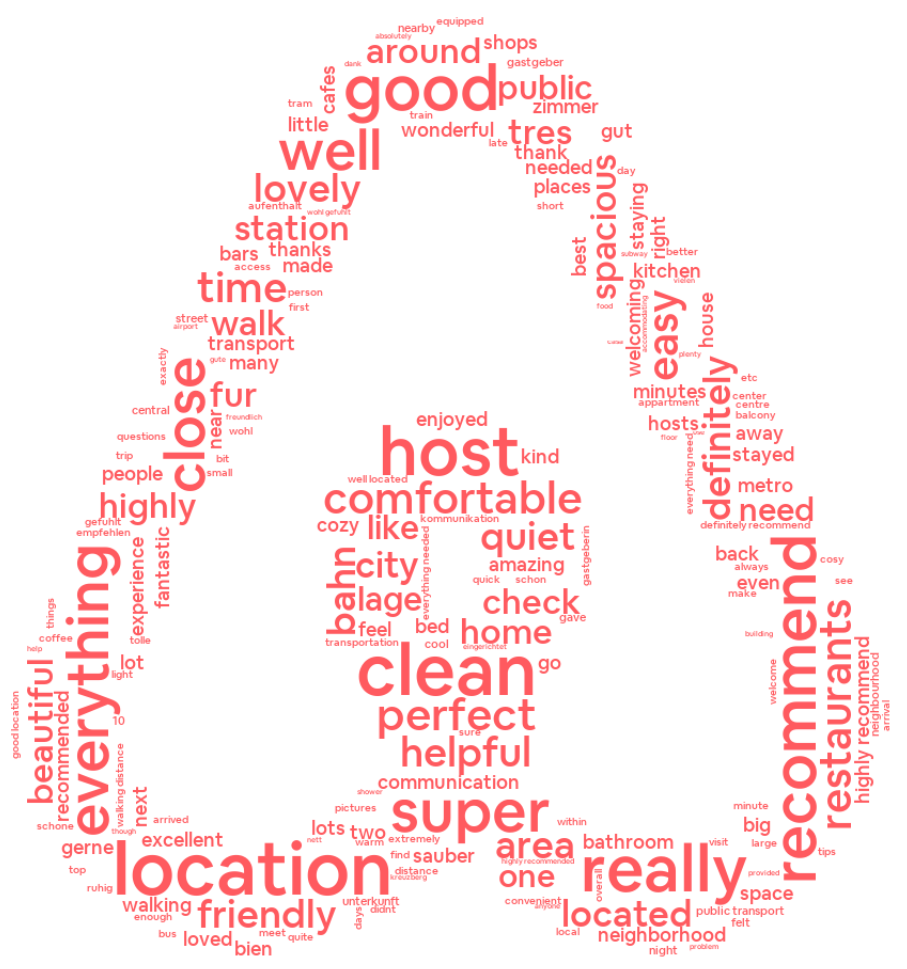

## Executive Summary
_______
   
### The goal
____
   
To accuratly predict the occupancy of an Airbnb listing; i.e. how many nights per month on average that a listing is occupied. Occupancy rate can be used as an indicater of how successful an Airbnb listing is, as the writer does not believe that ratings are an accurate reflection of the success of an individual Airbnb.

The project also aims to determine which parts of a listing influences the occupancy.

The occupancy rate is predicted using both regression and classification models. For classification the occancy rate was classified into four classes using the quartile ranges of the log of the linear occupancy rate.

the occupancy levels correspond to:

|Quartile|  days    |level   |
|-------:|---------:|-------:|
|  >25%	 |1.2 days  |low     |
|25<x<50%|4.1 days  |med_low |
|50<x<75%|11.4 days |med_high| 
|  >75%	 |>11.4 days|high 	 |

 
 
### The DATA
____
The data was downloaded from http://insideairbnb.com/get-the-data.html in 2 no. .csv files. One file contains the Listing information such as number of rooms, type of dwelling, price, and average rating. The other file contains all the review comments and the date the review was posted. The data has been preprocessed by in before download.
 
The occupancy rate is a derived target variable, calculated by multiplying the number of reviews per month by the average stay in the city (2.4 days for berlin\*) multiplied by a review conversion factor to allow for stays that have not been reviewed (2.0 stays/review\*\*). If the minimum number of nights was higher than the average length of stay then this value was used.

The review data was proccessed on a per review basis, and then aggregated by listing to give average sentiment analysis. The comments were concatenated for each listing and vectorized, however this did not enhance the model and has been removed for now.
    
  
### The Metrics for model selection
____   
$r^2$ and $RMSE$ was used to compare the the regression models.
    
$accuracy$ for the classification models. As this model would be used more advising people on how to create or upgrade there Airbnb listing in the most efficient way recall and precision are not very important. ROC curves/scores will also be considered in the selection of the final model.
   
   
### The Findings/Conclusions
____   
The occupancy rate can be predicted with an $r^2$ score of 0.74 and an RMSE of 0.76 log(days) which is within the mean of 1.28 log(days) and std deviation of 1.51 log(days). Gradient boosting regression model proved to be the best regression model.

The occupancy level (quartile range class) can be predicted with 59% accuracy using a gradient boosting classifier. This compares favourably to a baseline of 25% if randomly classified. The classification of the high and low occupancy properties is more accurate than differentiating between the medium_high and medium_low occupancy listings as shown in the ROC curve below

<img align='left' src="../part_03/resources/Roc_curve.png" width="400">

There are very few negative reviews, so the sentiment, ratings and nlp and very heavily skewed positivly, leaving very little predictive power. An individual listing may have many positive reviews and very few negative reviews, so that the negative sentiment of any "negative" words is completly negated.
   

#### The risks/limitations/assumptions that affect these findings
____
  
  Listings can be deleted in the Airbnb platform. The data presented here is a snapshot of listings available at a particular time. Other snapshots of data from previous dates are available for analysis by request, and a future activity may be to analyse the characteristics of deleted Airbnb listings.

The Airbnb calendar for a listing does not differentiate between a booked night vs an unavailable night, therefore these bookings have been counted as "unavailable". This serves to understate the Availability metric because popular listings will be "booked" rather than being "blacked out" by a host.
    
Some hosts might not keep their calendar updated, or have it highly available even though they live in the entire home/apartment.
   
#### The Future work and considerations for real world production environment
___

- Look at additional cities to see if the same factors influence Airbnb listings in the same way. The workbook will be modified to easily accept a different city.
- Further analysis into the nlp and topic analysis of the comments and descriptions.
- Model stacking/voting for the classification models to see if better results can be achieved.
- To validate the models performance over time a further snapshot could be taken and compared against the original data set to see what changes have occured over time to each listing, and if the model is still valid.
- To put this model into production a pipeline needs to be set up to clean and process the data and then fit the model. Using Flask or another web interface the model could then be used by Airbnb owners to analyse there own Airbnb and see what they should change if they want to increase occupancy.
    
    
___
### references

\* https://www2.deloitte.com/content/dam/Deloitte/de/Documents/consumer-business/Hotelmarkt_Berlin_EN_safe.pdf

\*\* http://insideairbnb.com/about.html#disclaimers 

***This Jupyter notebook contains initial models to determine if the data can be used to make predictions. Refer to the Airbnb_part_4_b for EDA and other processing***

 1. The data is imported from two .csv files.
 
    * 'Berlin_avg_listing_sent_en' - contains the Vader and TFIDF processed reviews grouped by listing
    * 'berlin_listing_clean.csv' - contains the information about each listing
    
    
 2. The tables are merged on the listing id to form 1 table.
 
 3. **Regression models** are tried first. y_target = occucupancy_rate
 
    * regression models are not giving good results. i.e. negative r2 scores
    * models are built ignoring count vectorization. 
    
    
 4. **Classification models**. The occupancy_rate is converted to high/medium/low occupancy_level by thirds
    * These models seem to be giving more useable results - Grad boost model accuracy of 0.68 (baseline = 0.55)
    * models are built ignoring count vectorization. 
        

In [2]:
import warnings
import pandas as pd
import scipy as sp
import numpy as np
import scipy.stats as stats
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import scikitplot as skplt
import seaborn as sns
import datetime
from dateutil.relativedelta import relativedelta
import scipy as sp


import cufflinks as cf
import plotly.plotly as py
import plotly.tools as tls
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=False)
cf.go_offline()

sns.set(font_scale=1.5)
plt.style.use('fivethirtyeight')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)


In [3]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV, LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import cross_val_score, GridSearchCV,train_test_split
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc
from sklearn import metrics

from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier, GradientBoostingRegressor,GradientBoostingClassifier,AdaBoostClassifier,AdaBoostRegressor
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC,LinearSVC

from sklearn.decomposition import PCA, TruncatedSVD
import pickle


## Import/Clean/Join The Data

In [4]:
listing = pd.read_csv('../Capstone_DATA/Berlin/berlin_listing_clean.csv',
                      index_col=0,
                      parse_dates=True,
                      infer_datetime_format=True
                      )

FileNotFoundError: File b'../Capstone_DATA/Berlin/berlin_listing_clean.csv' does not exist

In [ ]:
listing.review_scores_rating.plot(kind='hist',title = 'Histogram of Review scores',bins=30);#),xTitle='Review scores',asImage=True, filename='Review_scores_histogram.png')

In [ ]:
listing_reviews=pd.read_csv('../Capstone_DATA/Berlin/Berlin_avg_listing_sent_en')

In [ ]:
listing.shape

In [ ]:
#listing_reviews.drop(columns=['listing_id.1','id','reviewer_id'],inplace=True)

In [ ]:
listing_reviews.info()

In [ ]:
listing.head()

#### Split up the amenities column into seperate binary columns using cvec

In [ ]:
b = listing.amenities.map(lambda x:x.strip("{").strip('}').replace(' ',"_").replace(','," ")
                          .replace('/','_')
                          .replace('-','_')
                          .replace('"',""))

In [ ]:
b[:5]

In [ ]:
cvec_amen = CountVectorizer(analyzer='word',
                       strip_accents=None,
                       lowercase=False)
cvec_amen.fit(b)
cvec_amen_matrix = cvec_amen.transform(b)
cvec_amen_matrix
cvec_amen_df = pd.DataFrame(cvec_amen_matrix.todense(), index=listing.id,columns=cvec_amen.get_feature_names())

In [ ]:
cvec_amen_df.shape

In [ ]:
listing_reviews.head()

In [ ]:
listing = pd.merge(listing, cvec_amen_df, how='left',
                   right_index=True, left_on='id')

In [ ]:
listing = pd.merge(listing, listing_reviews, how='inner',
                   right_on='listing_id', left_on='id')

In [ ]:
listing.shape

In [ ]:
#Does the nlanguage of the description have an affect?
# https://github.com/Mimino666/langdetect for the package details

from langdetect import detect

def lang_detect(text):
    """fuction for error management due to error when no text is contained in the comment"""
    try:
        return detect(text)
    except:
        return 'na'

In [ ]:
listing['description_lang']=listing.description.map(lang_detect)

Lets check the distribution of the target variable (occupancy_rate)

In [ ]:
import math

In [ ]:
listing.occupancy_rate.describe()

In [ ]:
occupancy_log=listing.occupancy_rate.map(lambda x: np.log(x))

occupancy_log.plot(kind='hist', title='Histogram of log(Occupancy Rate)',bins=30);# 
                                               #xTitle = 'log(Occupancy Rate)')

In [ ]:
occupancy_log.describe()

In [ ]:
listing_id=list(listing['id'])

In [ ]:
len(listing_id)

In [ ]:
listing.info()

In [ ]:
#Save this for use later
descriptions=listing.description.copy()

In [ ]:
# Columns to drop
to_drop = ['id', 'listing_url', 'name', 'summary', 'space',
           'description', 'neighborhood_overview', 'notes', 'transit', 'access', 
           'interaction', 'house_rules', 'host_id', 'has_availability', 'first_review', 'last_review', 
           'is_business_travel_ready', 'reviews_per_month', 'occupancy_rate', 
           'listing_id', 'host_verifications', 'amenities','latitude','longitude','number_of_reviews',
           'length','last_to_first_review','vader_neg','vader_pos','vader_neu']

In [ ]:
# review columns - may use at later date
reviews_cols = ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

In [ ]:
# columns to dummify
cols_to_dummy = ['neighbourhood_group_cleansed', 'property_type',
                 'room_type', 'bed_type', 'cancellation_policy','description_lang']

In [ ]:
y=occupancy_log

In [ ]:
X=listing.drop(columns=to_drop)

In [ ]:
#X['last_to_first_review']=X.last_to_first_review.map(lambda x: x.split()[0])

In [ ]:
X = pd.get_dummies(X,columns=cols_to_dummy,drop_first=True)

In [ ]:
X.tail()

In [ ]:
X.info()

In [ ]:
#This heatmap is not readable from a display standpoint, but gives food information once zoomed in.
fig,ax=plt.subplots(figsize=(100,100))
ax = sns.heatmap(X.corr())
plt.show()


## Save X to CSV to save processing

In [ ]:
#X.to_csv('X_df')

In [ ]:
X=pd.read_csv('x_df',index_col='Unnamed: 0')

In [ ]:
X.head()

## Lets create a classification target while we are here ....

In [ ]:
occupancy_log.quantile([0.25,0.5,0.75])

In [ ]:
# lets classify based on the quartiles

In [ ]:
print('occupancy quantiles in days back to days:')
[math.exp(x) for x in occupancy_log.quantile([0.25,0.5,0.75])]

In [ ]:
# classify occupancy_rates as:  )

low=occupancy_log.quantile(0.25)
median =occupancy_log.quantile(0.5)
high=occupancy_log.quantile(0.75)

occupancy_level = occupancy_log.map(lambda x: 'low' if x <=low 
                                    else 'high' if x>=high 
                                    else 'med_low' if (x>low) and (x<median) 
                                    else 'med_high')
occupancy_level.head()
occupancy_level[:10]


## Where are the Airbnb listings?

In [ ]:
listing_id=list(listing['id'])
txt=['Listing ID: '+ str(listing_id[i]) +'<br>Occupancy level : ' + 
     occupancy_level[i] for i in range(len(listing_id))]

In [ ]:
mapbox_access_token = 'pk.eyJ1IjoianBlYTA4NCIsImEiOiJjanF4c2NzdHYxODA3NDNtdXZveDRsYjNsIn0.sHSmHLrDaUvAe-X3-AJJdg'

scl = [[0,'rgb(252,0,0)'],[0.5,'rgb(255,255,191)'],[1,'rgb(0,0,255)']]

data = [
    go.Scattermapbox(
        lat=listing.latitude,
        lon=listing.longitude,
        mode='markers',
        hovertext=txt,
        hoverinfo='text',
        marker=dict(
            size=4,
            colorscale = scl,
            cmin = 0,
            color = listing.occupancy_rate,
            cmax = 30,
            colorbar=dict(
                title="occupancy level"
            )
        ),

    )
]

layout = go.Layout(height=800,
    width=1000,
    autosize=True,
    title='AirBnbs in Berlin',
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        
        center=dict(
            lat=listing.latitude[0],
            lon=listing.longitude[0]
        ),
        pitch=0,
        zoom=11
    ),
)

fig = dict(data=data, layout=layout)
iplot(fig, filename='Multiple Mapbox')

## Modelling

### Regression Models

#### Simple Linear Regression

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, GridSearchCV,train_test_split

from sklearn.metrics import classification_report,confusion_matrix
from sklearn import metrics

In [ ]:
def get_accuracy(model, X_train, y_train, X_test, y_test, cv=5):
    model.fit(X_train,y_train)
    scores_train = cross_val_score(model, X_train, y_train, cv=cv)
    predictions_test = model.predict(X_test)
    sm = scores_train.mean()
    print("Average training score: {:0.3}".format(sm))
    print("Test score: {:0.3}".format(model.score(X_test, y_test)))
    return predictions_test


def print_cm_cr(y_true, y_pred):
    """prints the confusion matrix and the classification report"""
    confusion = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=[
                            'Predicted'], margins=True)
    print(confusion)
    print()
    print(metrics.classification_report(y_true, y_pred))

In [ ]:
def grid_search_func(estimator, params, X_train, y_train, X_test, y_test, 
                     scoring_function=metrics.accuracy_score, scoring='accuracy',cv=5):
    gs = GridSearchCV(
        estimator=estimator,
        param_grid=params,
        return_train_score=True,
        scoring=scoring,
        cv=cv,
        n_jobs=-1,
        verbose=2)

    gs.fit(X_train, y_train)

    print("Best score")
    print(gs.best_score_)
    print()
    print("Best estimator")
    print(gs.best_estimator_.get_params())
    print()

    predictions = gs.best_estimator_.predict(X_test)
    print('Test score: ', scoring_function(y_test, predictions))
    print()
    print_cm_cr(y_test, predictions)

    return gs

In [ ]:
def grid_search_reg_func(estimator, params, X_train, y_train, X_test, y_test, 
                     scoring_function=metrics.r2_score, scoring='MSE',cv=5):
    gs = GridSearchCV(
        estimator=estimator,
        param_grid=params,
        return_train_score=True,
        scoring=scoring,
        cv=cv,
        n_jobs=-1,
        verbose=2)

    gs.fit(X_train, y_train)

    print("Best score")
    print(gs.best_score_)
    print()
    print("Best estimator")
    print(gs.best_estimator_.get_params())
    print()

    predictions = gs.best_estimator_.predict(X_test)
    print('Test score: ', scoring_function(y_test, predictions))
    print('RMSE : ', metrics.mean_squared_error(y_test, predictions)**0.5)
    print()
    plt.hist((y_test-predictions),bins=40)

    return gs

In [ ]:
X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.3,shuffle=True,random_state=20)

In [ ]:
scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test =scaler.transform(X_test)

In [ ]:
model = LinearRegression()
cv = cross_val_score(model,X_train,y_train,n_jobs=-1,verbose=True,cv=5)
print('cross-val scores',cv)
print('==========================================')
print('mean cross-val training score : ',cv.mean())
l_model=model.fit(X_train,y_train)
predictions=l_model.predict(X_test)

print('Test score: ', metrics.r2_score(y_test, predictions))
print('RMSE : ',(metrics.mean_squared_error(y_test, predictions)**0.5))
print()

#### Try with regularization

In [ ]:
model=LassoCV(n_alphas=1000,cv=5,n_jobs=-1,)
model.fit(X_train,y_train)

print('model train score : ',model.score(X_train,y_train))
print('model test score : ',model.score(X_test,y_test))
print('best estimator alpha : ', model.alpha_)
la_model=model
predictions=la_model.predict(X_test)

print('Test score: ', metrics.r2_score(y_test, predictions))
print('RMSE : ', metrics.mean_squared_error(y_test, predictions)**0.5)
print()

In [ ]:
lasso_coefs=pd.DataFrame(model.coef_,index=X.columns)
lasso_coefs.iplot(kind='bar',title= 'Lasso coefficients')

In [ ]:
model=RidgeCV(alphas=np.logspace(-2,5,100),cv=5)

model.fit(X_train,y_train)
print('model train score : ',model.score(X_train,y_train))
print('model test score : ',model.score(X_test,y_test))
print('best estimator alpha : ', model.alpha_)
r_model=model
predictions=r_model.predict(X_test)

print('Test score: ', metrics.r2_score(y_test, predictions))
print('RMSE : ', metrics.mean_squared_error(y_test, predictions)**0.5)
print()

In [ ]:
y_test.describe()

In [ ]:
ridge_coefs=pd.DataFrame(model.coef_,index=X.columns)
ridge_coefs.plot(kind='barh',title= 'Ridge coefficients',figsize=(10,40));

In [ ]:
model_en = ElasticNetCV(l1_ratio=[0.000,0.0001,0.0005,.001,0.002,0.1, .9, .95, .99, 1],
                       alphas=np.logspace(-2,1,500),
                       cv=5)
model_en.fit(X_train,y_train)
print('model train score : ',model_en.score(X_train,y_train))
print('model test score : ',model_en.score(X_test,y_test))
print('best estimator l1_ratio : ', model_en.l1_ratio_)
print('best estimator alpha : ', model_en.alpha_)
predictions=model_en.predict(X_test)

print('RMSE : ', metrics.mean_squared_error(y_test, predictions)**0.5)
print()

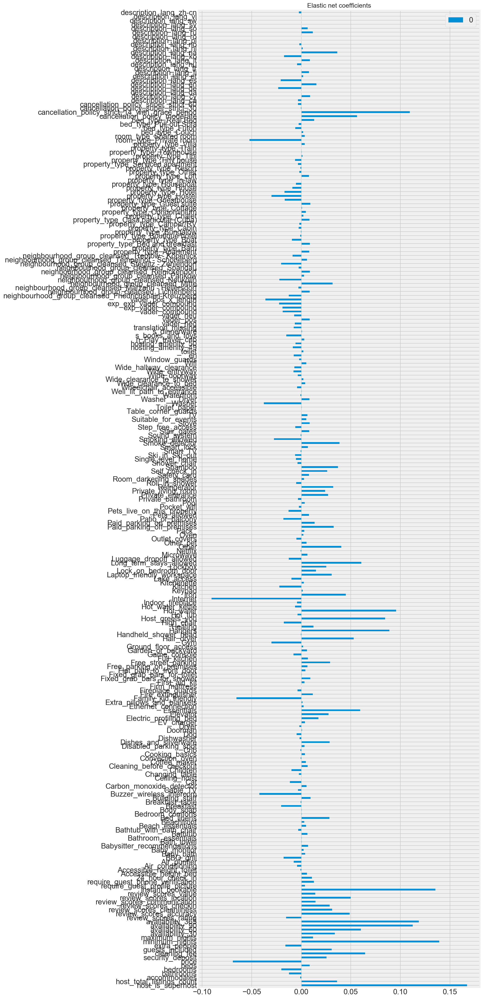

In [63]:
EN_coefs=pd.DataFrame(model_en.coef_,index=X.columns)
EN_coefs.plot(kind='barh',title= 'Elastic net coefficients',figsize=(10,40))

#### What about gradient Boosting regressor?

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed:  2.8min finished


Best score
0.7415490322662179

Best estimator
{'alpha': 0.9, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'ls', 'max_depth': 6, 'max_features': 0.6, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 130, 'n_iter_no_change': None, 'presort': 'auto', 'random_state': None, 'subsample': 0.9, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}

Test score:  0.7454829307852066

RMSE :  0.7624888028837927



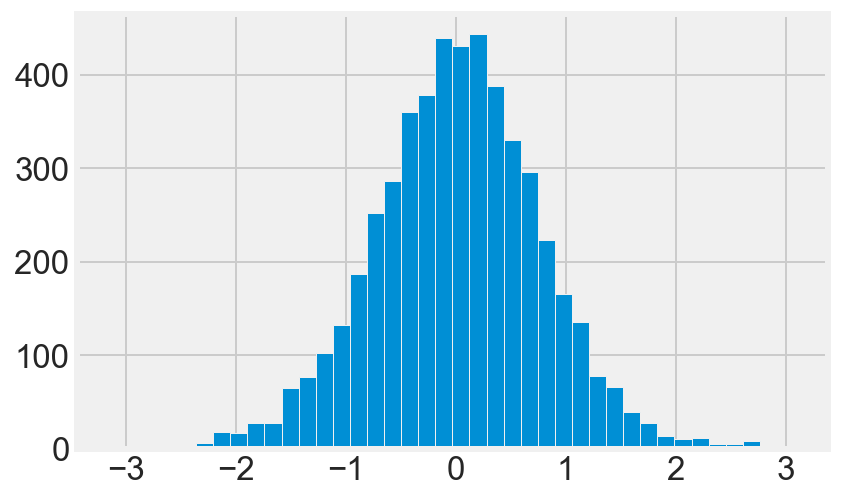

In [64]:
model_lin = GradientBoostingRegressor(n_estimators=130)

params_lin = {'subsample':[.8,0.9],
            'max_features':[0.4,0.5,0.6],
             'max_depth':[5,6,]}
gs = GridSearchCV(
        model_lin,
        params_lin,
        return_train_score=True,
        cv=3,
        n_jobs=-1,
        verbose=1)

gs.fit(X_train, y_train)

print("Best score")
print(gs.best_score_)
print()
print("Best estimator")
print(gs.best_estimator_.get_params())
print()

predictions = gs.best_estimator_.predict(X_test)
print('Test score: ', gs.score(X_test,y_test))
print()
predictions=gs.predict(X_test)

print('RMSE : ', metrics.mean_squared_error(y_test, predictions)**0.5)
print()
plt.hist((y_test-predictions),bins=40);


In [65]:
#I want to save these test sets for plotting when I come back to it
X_test_reg=X_test.copy()
X_train_reg=X_train.copy()
y_test_reg=y_test.copy()
y_train_reg=y_train.copy()

In [ ]:
fig, ax=plt.subplots(figsize=(12,12))

ax = sns.residplot(data=pd.DataFrame(X_test_reg,columns=X.columns),x='vader_compound',y=10**(y_test-predictions))
#ax = sns.regplot(data=pd.DataFrame(X_test_reg,columns=X.columns),x='vader_pos',y=predictions) 

In [67]:
gb_reg_best=gs.best_estimator_

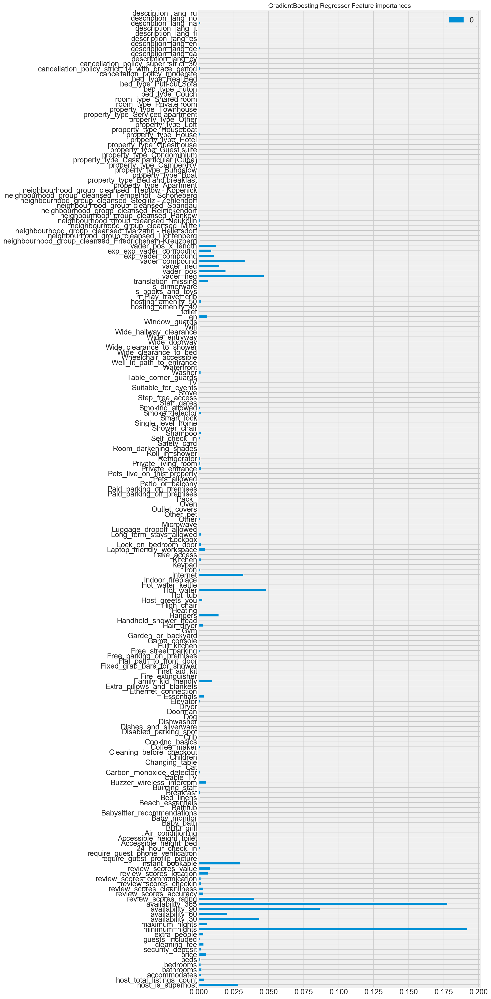

In [68]:
GB_coefs=pd.DataFrame(gb_reg_best.feature_importances_,index=X.columns)
GB_coefs[GB_coefs.values!=0].plot(kind='barh',title= 'GradientBoosting Regressor Feature importances',figsize=(10,40));

#### Add in the description cvec columns

In [98]:
desc = descriptions.fillna(' ')

In [99]:
X_train,X_test,y_train,y_test,desc_train,desc_test= train_test_split(X,y,desc,test_size=0.3,shuffle=True,random_state=30)

In [100]:
desc_train.shape

(11794,)

In [101]:
stop = stopwords.words(['english','german'])+['room','berlin','apartment']

cvec_desc = CountVectorizer(analyzer='word',
                       stop_words=stop,
                       strip_accents='unicode',
                       lowercase=True,
                       min_df=10
                       )
desc_train = cvec_desc.fit_transform(desc_train)
desc_test = cvec_desc.transform(desc_test)


In [102]:
desc_train

<11794x5493 sparse matrix of type '<class 'numpy.int64'>'
	with 631185 stored elements in Compressed Sparse Row format>

In [103]:
desc_test

<5055x5493 sparse matrix of type '<class 'numpy.int64'>'
	with 269033 stored elements in Compressed Sparse Row format>

In [104]:
non_cat = []
for col in X.columns:
    if X[col].dtypes!='object':
        non_cat.append(col)
        
X_train_sparse=sp.sparse.csr_matrix(X_train[non_cat].values)
X_train=sp.sparse.hstack([X_train_sparse, desc_train])

X_test_sparse=sp.sparse.csr_matrix(X_test[non_cat].values)
X_test=sp.sparse.hstack([X_test_sparse, desc_test])

In [105]:

scaler = StandardScaler(with_mean=False)
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

svd = TruncatedSVD(n_components=3000, random_state=1)
X_train = svd.fit_transform(X_train)
X_test = svd.transform(X_test)

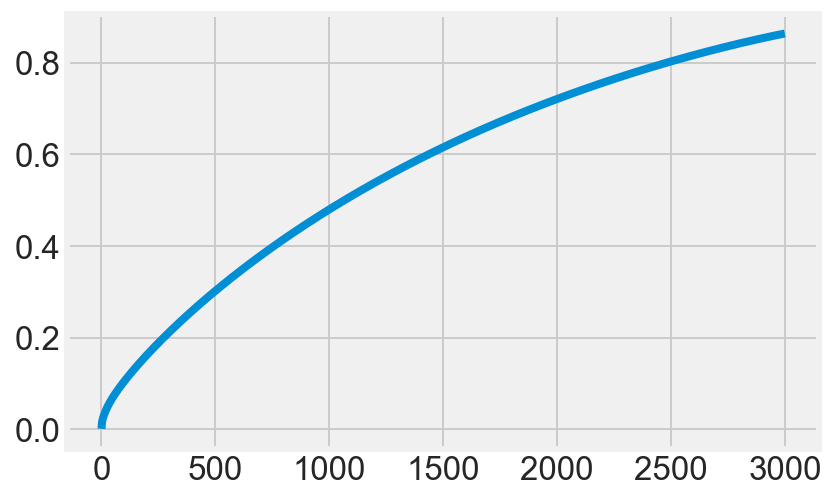

In [106]:
plt.plot(svd.explained_variance_ratio_.cumsum());

Because of the shallow slope of the explained variance graph 2500 X variables are required to explain 80% of the variance. This is too many variables to create a meaningful model within the available time. I will revisit these at a later time to see if it will help out the model.

In [107]:
"""model_lin = GradientBoostingRegressor(n_estimators=80)

params_lin = {'subsample':[.8,0.9],
            'max_features':[0.6,.9],
             'max_depth':[6,7]}
gs_reg = GridSearchCV(
        model_lin,
        params_lin,
        return_train_score=True,
        cv=3,
        n_jobs=-1,
        verbose=1)

gs_reg.fit(X_train, y_train)

print("Best score")
print(gs_reg.best_score_)
print()
print("Best estimator")
print(gs_reg.best_estimator_.get_params())
print()

predictions = gs_reg.best_estimator_.predict(X_test)
print('Test score: ', gs_reg.score(X_test,y_test))
print()
predictions=gs_reg.predict(X_test)

print('exp^RMSE : ', math.exp(metrics.mean_squared_error(y_test, predictions)**0.5))
print()
plt.hist((y_test-predictions),bins=40);
"""

'model_lin = GradientBoostingRegressor(n_estimators=80)\n\nparams_lin = {\'subsample\':[.8,0.9],\n            \'max_features\':[0.6,.9],\n             \'max_depth\':[6,7]}\ngs_reg = GridSearchCV(\n        model_lin,\n        params_lin,\n        return_train_score=True,\n        cv=3,\n        n_jobs=-1,\n        verbose=1)\n\ngs_reg.fit(X_train, y_train)\n\nprint("Best score")\nprint(gs_reg.best_score_)\nprint()\nprint("Best estimator")\nprint(gs_reg.best_estimator_.get_params())\nprint()\n\npredictions = gs_reg.best_estimator_.predict(X_test)\nprint(\'Test score: \', gs_reg.score(X_test,y_test))\nprint()\npredictions=gs_reg.predict(X_test)\n\nprint(\'exp^RMSE : \', math.exp(metrics.mean_squared_error(y_test, predictions)**0.5))\nprint()\nplt.hist((y_test-predictions),bins=40);\n'

**These models are giving reasonable results; much better than baseline with a very positive R2 score. lets try classification instead**

### Classification Models

In [69]:
y=occupancy_level

In [70]:
y.value_counts(normalize=True)

low         0.252062
high        0.250104
med_high    0.249926
med_low     0.247908
Name: occupancy_rate, dtype: float64

In [71]:
# Baseline is 0.252

In [72]:
X=pd.read_csv('x_df',index_col='Unnamed: 0')
X_train,X_test,y_train,y_test= train_test_split(X,y,test_size=0.3,stratify=y)

In [73]:
scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test =scaler.transform(X_test)

#### Try a Logistic Regression Classifier

In [ ]:
model = LogisticRegression()
cv = cross_val_score(model,X_train,y_train,n_jobs=-1,verbose=2,cv=5)
print('cross-val scores',cv)
print('==========================================')
print()
print('mean cross-val training score : ',cv.mean())
print()
print('==========================================')
model.fit(X_train,y_train)
test_preds = model.predict(X_test)
print(classification_report(y_test,test_preds))
labels=['low','med_low','med_high','high']
confusion = pd.DataFrame(confusion_matrix(y_test,test_preds,labels),columns=['pred '+ i for i in labels],
            index=['actual '+ i for i in labels])
print('=====================================')
print('model train score : ',model.score(X_train,y_train))
print('model test score : ',model.score(X_test,y_test))
print('=====================================\n             Confusion Matrix')

print(confusion)

In [ ]:
log_preds=test_preds

In [ ]:
model_lin=LogisticRegressionCV(multi_class='ovr',solver = 'liblinear')
params_lin = {'penalty':['l1','l2'],
            'Cs': [np.logspace(-2, 2, 11)],
              'fit_intercept': [True]}
gs_logcv = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')

In [ ]:
logCv_preds = gs_logcv.predict(X_test)

#### Desision Tree Classifier

In [77]:
DecisionTreeClassifier().get_params().keys()

dict_keys(['class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'presort', 'random_state', 'splitter'])

In [114]:
model_lin=DecisionTreeClassifier()
params_lin = {'max_features':[None,.4,.7,.9,1.],
             'max_depth':[6,7,8,9,10,11,None]}
gs_des = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')


Fitting 5 folds for each of 35 candidates, totalling 175 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 175 out of 175 | elapsed:   20.8s finished


Best score
0.5219603188061727

Best estimator
{'class_weight': None, 'criterion': 'gini', 'max_depth': 7, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': False, 'random_state': None, 'splitter': 'best'}

Test score:  0.5210682492581602

Predicted  high   low  med_high  med_low   All
Actual                                        
high        762    26       357      119  1264
low          28   800       103      343  1274
med_high    380    99       446      339  1264
med_low     109   258       260      626  1253
All        1279  1183      1166     1427  5055

              precision    recall  f1-score   support

        high       0.60      0.60      0.60      1264
         low       0.68      0.63      0.65      1274
    med_high       0.38      0.35      0.37      1264
     med_low       0.44      0.50      0.47      1253

   micro avg  

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 175 out of 175 | elapsed:   22.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_features': [None, 0.4, 0.7, 0.9, 1.0], 'max_depth': [6, 7, 8, 9, 10, 11, None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='accuracy', verbose=2)

In [121]:
best=gs_des.best_estimator_.fit(X_train,y_train)

In [119]:
desision_pred = gs_des.predict(X_test)

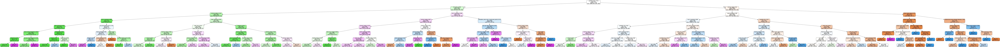

In [124]:
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus
from ipywidgets import *
from IPython.display import display
from IPython.display import Image
dot_data = StringIO() 
export_graphviz(best, 
                out_file=dot_data,  
                filled=True, 
                rounded=True,
                special_characters=True,
                feature_names=X.columns
               )  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 

Image(graph.create_png()) 



#### Random Forest Classifier

In [83]:
model_rand=RandomForestClassifier(n_estimators=100)
params_lin = {'max_features':[None,.7,.8,1.],
             'max_depth':[6,7,8,9,11,None],
             'criterion':['entropy','gini'],
             'min_samples_leaf':[1,2,3,4],
             'max_features':[.7,.8,.9,1.,'auto']}
gs_for = grid_search_func(model_rand, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')
forest_preds= gs_for.predict(X_test)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 22.8min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed: 46.9min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 65.9min
[Parallel(n_jobs=-1)]: Done 1200 out of 1200 | elapsed: 82.0min finished


Best score
0.5745294217398678

Best estimator
{'bootstrap': True, 'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'max_features': 0.9, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 3, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}

Test score:  0.5804154302670623

Predicted  high   low  med_high  med_low   All
Actual                                        
high        863    17       290       94  1264
low          23   925        90      236  1274
med_high    391    82       503      288  1264
med_low      92   237       281      643  1253
All        1369  1261      1164     1261  5055

              precision    recall  f1-score   support

        high       0.63      0.68      0.66      1264
         low       0.73      0.73      0.73      1274
    med_high       0.43      0.40      0.41  

#### Try Gradient Boosting Model

In [84]:
model_lin=GradientBoostingClassifier()
params_lin = {
            'max_features':[0.8,.9,1.],
            "n_estimators":[90,100,120],
             'max_depth':[5,6,7]}
gs_grad = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                          cv=3)


Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed: 48.8min finished


Best score
0.5956418517890453

Best estimator
{'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 5, 'max_features': 0.8, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 120, 'n_iter_no_change': None, 'presort': 'auto', 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}

Test score:  0.5972304648862512

Predicted  high   low  med_high  med_low   All
Actual                                        
high        902    10       282       70  1264
low          14   940        93      227  1274
med_high    380    64       529      291  1264
med_low      82   244       279      648  1253
All        1378  1258      1183     1236  5055

              precision    recall  f1-score   support

        high       0.65      0.71      0.68      1264
         low

In [86]:
gs_best = gs_grad.best_estimator_
gs_best.fit(X_train,y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=5,
              max_features=0.8, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=120,
              n_iter_no_change=None, presort='auto', random_state=None,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

In [87]:
grad_pred=gs_best.predict(X_test)

In [88]:
len(X.columns)

245

In [89]:
gs_best.feature_importances_
GB_importances=pd.DataFrame(gs_best.feature_importances_,index=X.columns)
GB_importances.iplot(kind='bar',title= 'Gradient Boosting feature importances')

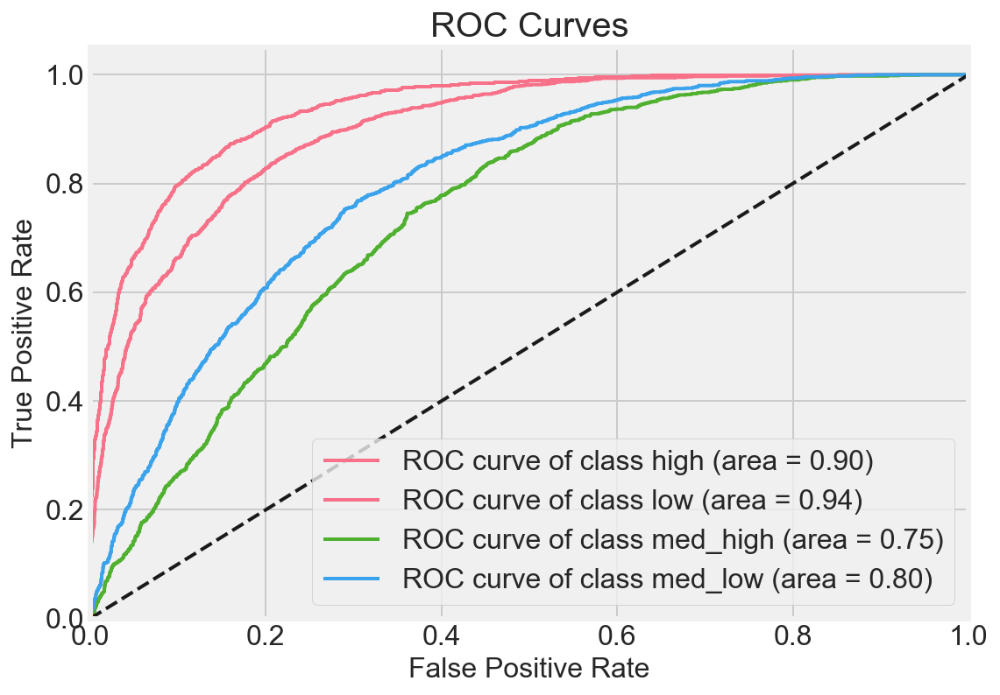

In [90]:
cmap = ListedColormap(sns.color_palette("husl",3))
skplt.metrics.plot_roc(y_test, gs_best.predict_proba(X_test), plot_micro=False, plot_macro=False, 
                       title_fontsize=20, text_fontsize=16, figsize=(8,6), cmap=cmap)
plt.show()

In [91]:
def plot_f1_lines(figsize=(8,6),fontsize=16):
    '''Create f1-score level lines to be added to the precison-recall plot'''

    fig, ax = plt.subplots(figsize=figsize)
    
    # add lines of constant F1 scores
    
    for const in np.linspace(0.2,0.9,8):
        x_vals = np.linspace(0.001, 0.999, 100)
        y_vals = 1./(2./const-1./x_vals)
        ax.plot(x_vals[y_vals > 0], y_vals[y_vals > 0],
                 color='lightblue', ls='--', alpha=0.9)
        ax.set_ylim([0, 1])
        ax.annotate('f1={0:0.1f}'.format(const),
                     xy=(x_vals[-10], y_vals[-2]+0.0), fontsize=fontsize)

    return fig, ax

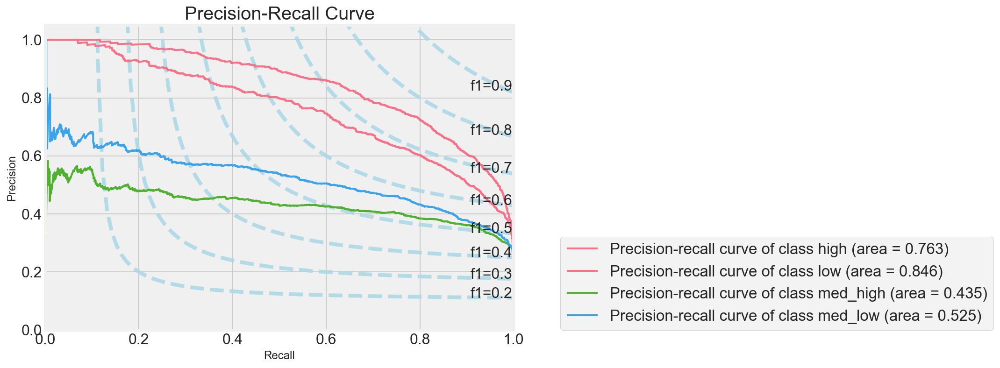

In [92]:
fig, ax = plot_f1_lines()
skplt.metrics.plot_precision_recall(y_test, gs_best.predict_proba(X_test), 
                       plot_micro=False, 
                       title_fontsize=20, text_fontsize=16, cmap=cmap, ax=ax)
ax.legend(loc=[1.1,0])
plt.show()

* **This model gives an OK result. An accuracy score of 0.68 is 30% higher than baseline.**

#### Try Catboost model

In [ ]:
#from catboost import CatBoostClassifier

In [ ]:
#model=CatBoostClassifier(iterations=500,learning_rate=0.1)
#model.fit(X_train, y_train,eval_set=(X_test, y_test))

In [ ]:
# params_cat = {"depth":[3,4,5,6],
#              'l2_leaf_reg':np.linspace(0,10,11)}
# gs_cat = grid_search_func(model, params_cat,
#                           X_train, y_train, X_test, y_test,
#                           scoring_function=metrics.accuracy_score,
#                           scoring='accuracy')

The Classification models are working. This is a good start and further modelling will be developed from this point

## Lets use the vectorized comments

In [ ]:
#This will require PCA to enable this to run in time


In [ ]:
cvec_matrix = sp.sparse.load_npz('cvec_matrix.npz')
#tfidf_matrix = scipy.sparse.load_npz('tfidf_matrix.npz')
cvec_matrix

In [ ]:
X.columns

In [ ]:
non_cat = []
for col in X.columns:
    if X[col].dtypes!='object':
        non_cat.append(col)

In [ ]:
X_sparse=sp.sparse.csr_matrix(X[non_cat].values)

In [ ]:
X_sparse

In [ ]:
X_sparse_1=sp.sparse.hstack([X_sparse, cvec_matrix])

In [ ]:
X_train,X_test,y_train,y_test= train_test_split(X_sparse_1,y,test_size=0.5,shuffle=True,random_state=30)

In [ ]:
scaler = StandardScaler(with_mean=False)
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [ ]:
svd = TruncatedSVD(n_components=1500, random_state=1)
svd.fit(X_train)
X_train_svd = svd.transform(X_train)
X_test_svd = svd.transform(X_test)

In [ ]:
X_train_svd.shape

In [ ]:
plt.plot(svd.explained_variance_ratio_.cumsum());

In [ ]:
#X_train,X_test,y_train,y_test= train_test_split(X_train_1,y_test_1,test_size=0.3,shuffle=True,random_state=40)

### Try a logit first

In [ ]:
X_train=X_train_svd
X_test=X_test_svd

In [ ]:
model = LogisticRegression()
cv = cross_val_score(model,X_train,y_train,n_jobs=-1,verbose=True,cv=5)
print('cross-val scores',cv)
print('==========================================')
print()
print('mean cross-val training score : ',cv.mean())
print()
print('==========================================')
model.fit(X_train,y_train)
test_preds = model.predict(X_test)
print(classification_report(y_test,test_preds))
labels=['low','med_low','med_high','high']
confusion = pd.DataFrame(confusion_matrix(y_test,test_preds,labels),columns=['pred '+ i for i in labels],
            index=['actual '+ i for i in labels])
print('=====================================')
print('model train score : ',model.score(X_train,y_train))
print('model test score : ',model.score(X_test,y_test))
print('=====================================\n             Confusion Matrix')

print(confusion)

In [ ]:
model_lin=LogisticRegression(multi_class='ovr',solver = 'liblinear')
params_lin = {'penalty':['l1','l2'],
            'C': np.logspace(-2, 2, 10),
              'fit_intercept': [True,False]}
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')

In [ ]:
### SVM model

In [ ]:
LinearSVC().get_params().keys()

In [ ]:
SVC().get_params().keys()

In [ ]:
model_lin=LinearSVC(dual=False)
params_lin = {'C':np.logspace(-3,0,5) ,
              'penalty':['l1'],
              'fit_intercept':[True]
         }
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                             cv=3)

In [ ]:
model_lin=SVC()
params_lin = {'C':np.logspace(-1,2,5),
             'kernel':['rbf'] ,
              'gamma':np.logspace(-3,0,5)
         }
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                             cv=3)

### Then GradBoost

In [ ]:
model_lin=GradientBoostingClassifier()
params_lin = {"n_estimators":[50,60,80,100],
             'max_depth':[5,6]}
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                             cv=3)


In [ ]:
gs_best = gs_lin.best_estimator_
gs_best.fit(X_train,y_train)

### XGBoost

In [ ]:
# fit model on training data
model = XGBClassifier()
cv = cross_val_score(model,X_train,y_train,n_jobs=-1,verbose=True,cv=5)
print('cross-val scores',cv)
print('==========================================')
print()
print('mean cross-val training score : ',cv.mean())
print()
print('==========================================')
model.fit(X_train,y_train)
test_preds = model.predict(X_test)


In [ ]:
print(classification_report(y_test,test_preds))
labels=['low','med_low','med_high','high']
confusion = pd.DataFrame(confusion_matrix(y_test,test_preds,labels),columns=['pred '+ i for i in labels],
            index=['actual '+ i for i in labels])
print('=====================================')
print('model train score : ',model.score(X_train,y_train))
print('model test score : ',model.score(X_test,y_test))
print('=====================================\n             Confusion Matrix')

print(confusion)

## What about Topics?

In [ ]:
topic_matrix = np.load('listing_topic_mat.csv.npy')

In [ ]:
topic=pd.DataFrame(topic_matrix,columns=['topic_{}'.format(x) for 
                                               x in range(topic_matrix.shape[1])])

In [ ]:
topic.head()

In [ ]:
X_t=pd.merge(X,topic,left_index=True,right_index=True)
X_train,X_test,y_train,y_test= train_test_split(X_t,y,test_size=0.5,shuffle=True,random_state=30)
scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [ ]:
model_lin=DecisionTreeClassifier()
params_lin = {'max_features':[.6,.7,.8],
             'max_depth':[6,7,8],
             'criterion':['entropy','gini'],
             'min_samples_leaf':[3,4,5]}
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')

In [ ]:
model_rand=RandomForestClassifier(n_estimators=100)
params_lin = {'max_features':[None,.7,.8,1.],
             'max_depth':[6,7,8,9,11,None],
             'criterion':['entropy','gini'],
             'min_samples_leaf':[1,2,3,4],
             'max_features':[.7,.8,.9,1.,'auto']}
gs_lin = grid_search_func(model_rand, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy')

In [ ]:
model_lin=GradientBoostingClassifier(n_estimators=150)
params_lin = {
              'criterion':['friedman_mse','mse','mae'],
              'subsample':[.6,.7,.8,.9,1.],
             'max_depth':[4,5,6]}
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                             cv=3)

## Add in the description cvecs

In [ ]:
descriptions=listing.description.copy()

In [ ]:
stop = stopwords.words(['english','german'])

In [ ]:
#This will be used later
cvec_desc = CountVectorizer(analyzer='word',
                       stop_words=stop,
                       strip_accents='unicode',
                       lowercase=True,
                       ngram_range=(1,3),
                       )
cvec_desc.fit(descriptions.fillna(' '))
cvec_desc_matrix = cvec_desc.transform(descriptions.fillna(' '))
cvec_desc_matrix
cvec_desc = pd.DataFrame(cvec_desc_matrix.sum(axis=0).ravel(),
                 columns=cvec_desc.get_feature_names()).T.sort_index(by=0, ascending=False)[:1000]

In [ ]:
cvec_desc[:20]

In [ ]:
non_cat = []
for col in X.columns:
    if X[col].dtypes!='object':
        non_cat.append(col)
        
X_sparse=sp.sparse.csr_matrix(X[non_cat].values)
X_d=sp.sparse.hstack([X_sparse, cvec_desc_matrix])

In [ ]:
svd = TruncatedSVD(n_components=1500, random_state=1)
svd.fit(cvec_desc_matrix)
cvec_svd = svd.transform(cvec_desc_matrix)


In [ ]:
plt.plot(svd.explained_variance_ratio_.cumsum());

In [ ]:
X_train,X_test,y_train,y_test= train_test_split(cvec_svd,y,test_size=0.5,shuffle=True,random_state=30)
scaler = StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [ ]:
model_lin=GradientBoostingClassifier(n_estimators=150)
params_lin = {
              'criterion':['friedman_mse','mse','mae'],
              'subsample':[.6,.7,.8,.9,1.],
             'max_depth':[4,5,6]}
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train, y_train, X_test, y_test,
                          scoring_function=metrics.accuracy_score,
                          scoring='accuracy',
                             cv=3)